In [1]:
import re
import time
from tqdm import tqdm

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from selenium import webdriver
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.common.by import By

import nltk
from nltk.corpus import stopwords as nltk_stopwords

from pymystem3 import Mystem
from wordcloud import WordCloud

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import cross_validate
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import auc
from sklearn.metrics import roc_curve

In [77]:
# path_driver = './chrome-driver/yandexdriver.exe'
# url_youtube = 'https://www.youtube.com/watch?v=6mrb5NcoBYY&ab_channel=Россия-Украина'
# options = webdriver.ChromeOptions()

# with webdriver.Chrome(executable_path=path_driver, options=options) as driver:
#     wait = webdriver.support.ui.WebDriverWait(driver, 1)
#     driver.get(url_youtube)
#
#     for item in tqdm(range(200)):
#         wait.until(
#             EC.visibility_of_element_located((By.TAG_NAME, "body"))
#         ).send_keys(webdriver.common.keys.Keys.END)
#
#         time.sleep(1)
#
#     for comment in wait.until(
#             EC.presence_of_all_elements_located((By.CSS_SELECTOR, '#content'))
#     ):
#         scrapped.append(comment.text)

In [2]:
path_comments_putin = './Data/comments_putin.csv'
path_comments_shulman = './Data/comments_shulman.csv'

In [79]:
comments_shulman_df = pd.read_csv(path_comments_shulman, index_col=0)
comments_putin_df = pd.read_csv(path_comments_putin, index_col=0)

In [80]:
comments_putin_df.head()

,comment
0,Народ тебя никогда не забудет
1,"Желаю путину всего того , что он сделал для на..."
2,"Зашёл сюда не послушать, а почитать! Сильно у..."
3,"2046 год. Путин: ""Год был непростым, прошу отн..."
4,"Я ждал что он скажет ""уходящий год был непрост..."


In [81]:
comments_putin_df.shape

(3344, 1)

In [82]:
comments_shulman_df.head()

,comment
0,Новогоднее обращение которое приятно смотреть!...
1,"С Новым годом, Екатерина Михайловна!!! Вы - лу..."
2,"Невероятная умница Екатерина! Дарит крылья, си..."
3,"С Новым годом, уважаемая Екатерина Михайловна!..."
4,"В этом году я открыла для себя вас, Екатерина ..."


In [83]:
comments_shulman_df.shape

(2254, 1)

In [84]:
def clear_text(text: str) -> str:
    cleared_text = re.sub(r'[^А-яЁё]+', ' ', text).lower()
    return " ".join(cleared_text.split())

In [85]:
def clean_stop_words(text: str, stopwords: list):
    text = [word for word in text.split() if word not in stopwords]
    return " ".join(text)

In [86]:
stopwords = set(nltk_stopwords.words('russian'))

In [87]:
start_clean = time.time()

comments_putin_df['text_clear'] = comments_putin_df['comment'].apply(
    lambda x: clean_stop_words(clear_text(str(x)), stopwords)
)

print('Обработка текстов заняла:', str(round(time.time() - start_clean, 2)), 'секунд')

Обработка текстов заняла: 0.03 секунд


In [88]:
start_clean = time.time()

comments_shulman_df['text_clear'] = comments_shulman_df['comment'].apply(
    lambda x: clean_stop_words(clear_text(str(x)), stopwords)
)

print('Обработка текстов заняла:', str(round(time.time() - start_clean, 2)), 'секунд')

Обработка текстов заняла: 0.02 секунд


In [89]:
shulman_counter = CountVectorizer(ngram_range=(1, 1))
putin_counter = CountVectorizer(ngram_range=(1, 1))

In [90]:
shulman_count = shulman_counter.fit_transform(comments_shulman_df['text_clear'])
putin_count = putin_counter.fit_transform(comments_putin_df['text_clear'])

In [91]:
shulman_frequence = pd.DataFrame(
    {'word': shulman_counter.get_feature_names_out(),
     'frequency': shulman_count.toarray().sum(axis=0)}
).sort_values(by='frequency', ascending=False)

putin_frequence = pd.DataFrame(
    {'word': putin_counter.get_feature_names_out(),
     'frequency': putin_count.toarray().sum(axis=0)}
).sort_values(by='frequency', ascending=False)

In [92]:
putin_frequence = putin_frequence.query('word not in @shulman_frequence.word')[:100]
shulman_frequence = shulman_frequence.query('word not in @putin_frequence.word')[:100]

In [93]:
wordcloud_shulman = WordCloud(
    background_color='black',
    colormap='Blues',
    max_words=200,
    mask=None,
    width=1600,
    height=1600,
).generate_from_frequencies(dict(shulman_frequence.values))

wordcloud_putin = WordCloud(
    background_color='black',
    colormap='Oranges',
    max_words=200,
    mask=None,
    width=1600,
    height=1600,
).generate_from_frequencies(dict(putin_frequence.values))

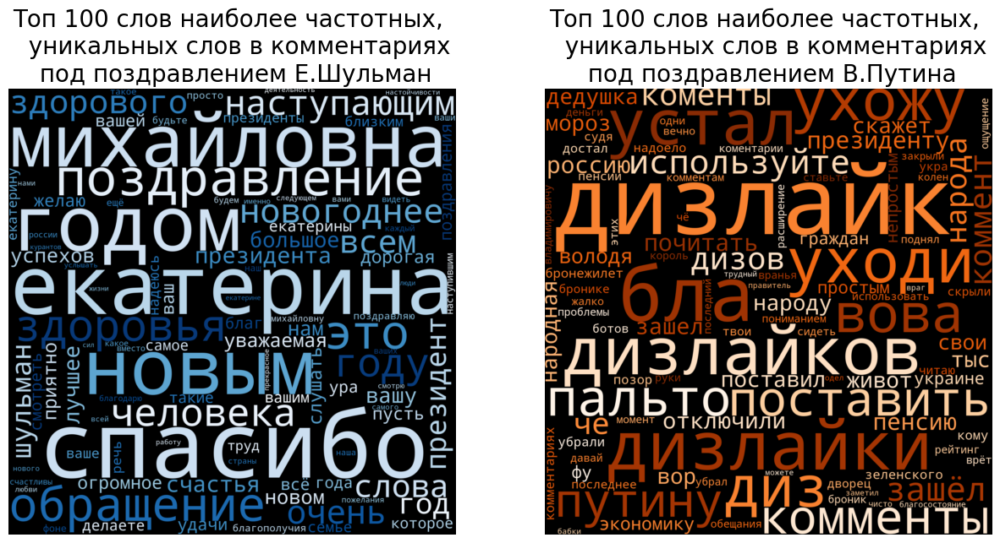

In [94]:
fig, ax = plt.subplots(1, 2, figsize=(15, 12))

ax[0].imshow(wordcloud_shulman, interpolation='bilinear')
ax[1].imshow(wordcloud_putin, interpolation='bilinear')

ax[0].set_title(
    'Топ ' + str(shulman_frequence.shape[0]) +\
    ' слов наиболее частотных, \n ' +\
    ' уникальных слов в комментариях\n' +\
    ' под поздравлением Е.Шульман',
    fontsize=20
)

ax[1].set_title(
    'Топ ' + str(putin_frequence.shape[0]) + \
    ' слов наиболее частотных, \n ' + \
    ' уникальных слов в комментариях\n' + \
    ' под поздравлением В.Путина',
    fontsize=20
)

ax[0].axis('off')
ax[1].axis('off');

In [95]:
path_file_tweets = '../Data/labeled_tweets_clean.csv'
labeled_tweets = pd.read_csv(path_file_tweets, index_col=0)

In [96]:
labeled_tweets.shape

(226834, 2)

In [97]:
labeled_tweets = labeled_tweets.dropna()

In [98]:
labeled_tweets.columns = ['text', 'label']

In [99]:
train, test = train_test_split(
    labeled_tweets,
    test_size=0.2,
    random_state=12348
)

In [100]:
for sample in [train ,test]:
    print(sample[sample['label'] == 1].shape[0] / sample.shape[0])

0.5073367045002871
0.5041293114869938


In [101]:
count_idf_i = TfidfVectorizer(ngram_range=(1, 1))

In [102]:
tf_idf_train_base_1 = count_idf_i.fit_transform(train['text'])
tf_idf_test_base_1 = count_idf_i.transform(test['text'])

In [103]:
tf_idf_train_base_1.shape, tf_idf_test_base_1.shape

((181144, 149872), (45286, 149872))

In [104]:
sample = test.sample(n=1)['text']
sample_tf_idf = count_idf_i.transform(sample)

In [105]:
array = sample_tf_idf.toarray()

In [106]:
display(sample)
display(array[array != 0])

115342    место девушке положении примчится расталкивая ...
Name: text, dtype: object

array([0.29735075, 0.31001292, 0.21607902, 0.24694122, 0.38337438,
       0.35927715, 0.4074716 , 0.4074716 , 0.3157249 ])

In [107]:
model_lr_base_1 = LogisticRegression(
    solver='lbfgs',
    random_state=12345,
    max_iter=10000,
    n_jobs=1
)

In [108]:
model_lr_base_1.fit(tf_idf_train_base_1, train['label']);

In [109]:
predict_lr_base_proba = model_lr_base_1.predict_proba(tf_idf_test_base_1)

In [110]:
def coin_classifier(X: np.array) -> np.array:
    predict = np.random.uniform(0., 1., X.shape[0])
    return predict

In [111]:
coin_predict = coin_classifier(tf_idf_test_base_1)

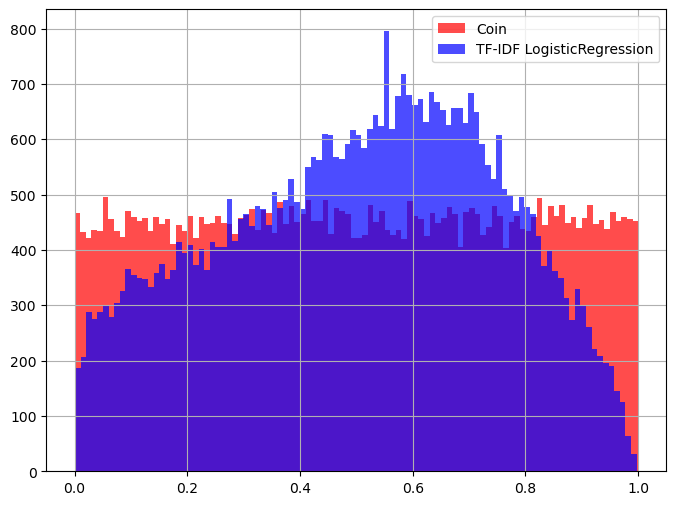

In [112]:
fig = plt.figure(figsize=(8, 6))

pd.Series(coin_predict).hist(
    bins=100,
    alpha=0.7,
    color='r',
    label='Coin'
)

pd.Series(predict_lr_base_proba[:, 1]).hist(
    bins=100,
    alpha=0.7,
    color='b',
    label='TF-IDF LogisticRegression'
)

plt.legend();

In [113]:
fpr_coin, tpr_coin, _ = roc_curve(test['label'], coin_predict)
roc_auc_coin = auc(fpr_coin, tpr_coin)

In [114]:
fpr_base, tpr_base, _ = roc_curve(test['label'], predict_lr_base_proba[:, 1])
roc_auc_base = auc(fpr_base, tpr_base)

In [1]:
fig = make_subplots(
    1, 1,
    subplot_titles=['Receiver operating characteristic'],
    x_title='False Positive Rate',
    y_title='True Positive Rate'
)

fig.add_trace(go.Scatter(
    x=fpr_base,
    y=tpr_base,
    fill='tozeroy',
    name='ROC base (area = %0.3f)' %roc_auc_base
))
fig.add_trace(go.Scatter(
    x=fpr_coin,
    y=tpr_coin,
    mode='lines',
    line=dict(dash='dash'),
    name='Coin classifier (area = 0.5)'
))

fig.update_layout(
    height=600,
    width=800,
    xaxis_showgrid=False,
    xaxis_zeroline=False,
    template='plotly_dark',
    font_color='rgba(212, 210, 210, 1)'
)

NameError: name 'make_subplots' is not defined

In [116]:
weights = pd.DataFrame({'words': count_idf_i.get_feature_names_out(),
                        'weights': model_lr_base_1.coef_.flatten()})
weights_min = weights.sort_values(by='weights')
weights_max = weights.sort_values(by='weights', ascending=False)

In [117]:
weights_min = weights_min[:100]
weights_min['weights'] = weights_min['weights'] * -1

In [118]:
weights_max = weights_max[:100]

In [119]:
wordcloud_positive = WordCloud(
    background_color='white',
    colormap='Blues',
    max_words=200,
    mask=None,
    width=1600,
    height=1600
).generate_from_frequencies(dict(weights_max.values))

wordcloud_negative = WordCloud(
    background_color='black',
    colormap='Reds',
    max_words=200,
    mask=None,
    width=1600,
    height=1600,
).generate_from_frequencies(dict(weights_min.values))

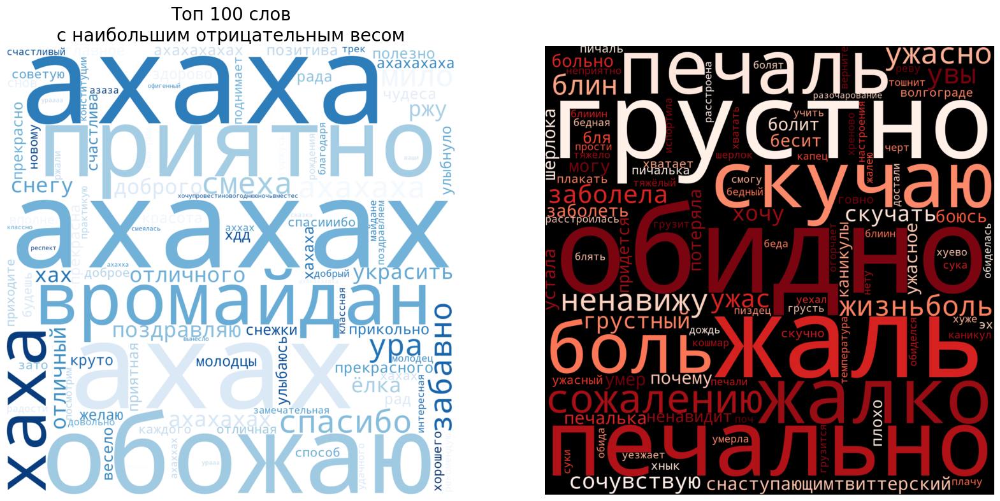

In [120]:
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

ax[0].imshow(wordcloud_positive, interpolation='bilinear')
ax[1].imshow(wordcloud_negative, interpolation='bilinear')

ax[0].set_title(
    'Топ ' + \
    str(weights_max.shape[0]) + \
    ' слов\n с наибольшим положительным весом ',
    fontsize=20
)
ax[0].set_title(
    'Топ ' + \
    str(weights_min.shape[0]) + \
    ' слов\n с наибольшим отрицательным весом ',
    fontsize=20
)

ax[0].axis('off')
ax[1].axis('off');

In [121]:
fig = make_subplots(1, 1)

fig.add_trace(go.Histogram(
    x=weights.query('weights != 0')['weights'],
    opacity=0.5,
    showlegend=False
))

fig.add_trace(go.Histogram(
    x=weights.query('weights > 0.25 or weights < -0.25')['weights'],
    opacity=0.5,
    showlegend=False
))

fig.update_layout(
    height=600,
    width=800,
    xaxis_showgrid=False,
    xaxis_zeroline=False,
    template='plotly_dark',
    font_color='rgba(212, 210, 210, 1)'
)

In [122]:
vocab = weights.query('weights > 0.25 or weights < -0.25')['words']

In [123]:
count_idf = TfidfVectorizer(vocabulary=vocab, ngram_range=(1, 1))

In [124]:
tf_idf_train = count_idf_i.fit_transform(train['text'])
tf_idf_test = count_idf_i.transform(test['text'])

In [125]:
model_lr_base = LogisticRegression(
    solver='lbfgs',
    random_state=12345,
    max_iter=10000,
    n_jobs=-1
)

In [126]:
model_lr_base_1.fit(tf_idf_train, train['label']);